# Lecture 2

## What we will learn?
1) We will look at the long term variation in Sun Spot Number(SSN).
2) Find out the period of the variation in the number of the suspots.
3) Find out when the next solar maximum and minima will occur.

# What are Sunspots?
These are spots on the surface of the sun, where magnetic field lines protude out from the solar surface (because of magnetic buoyancy). These spots appear cooler and darker because of strong magnetic field convection of the plasma is inhibited, which results in-efficient heat transfer.

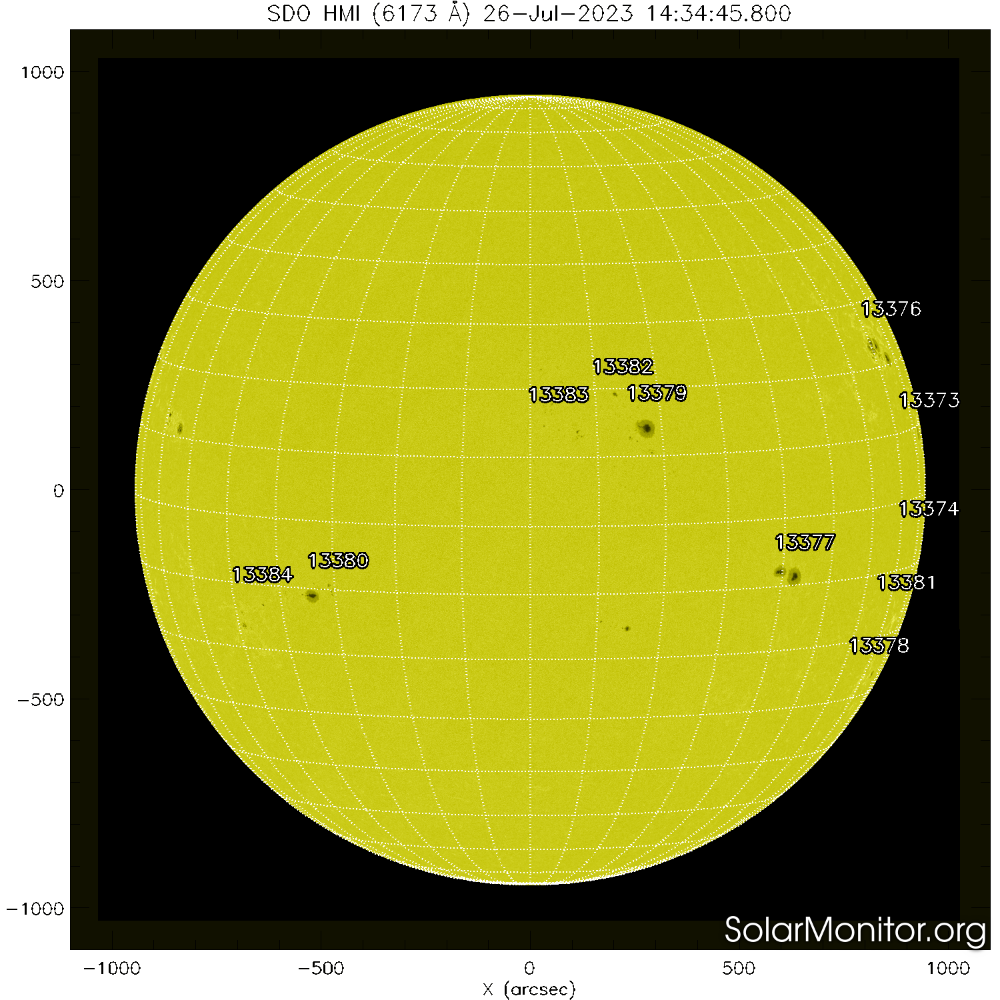

You can look at the Solar Dynamics Observatory data [here](https://www.solarmonitor.org/).

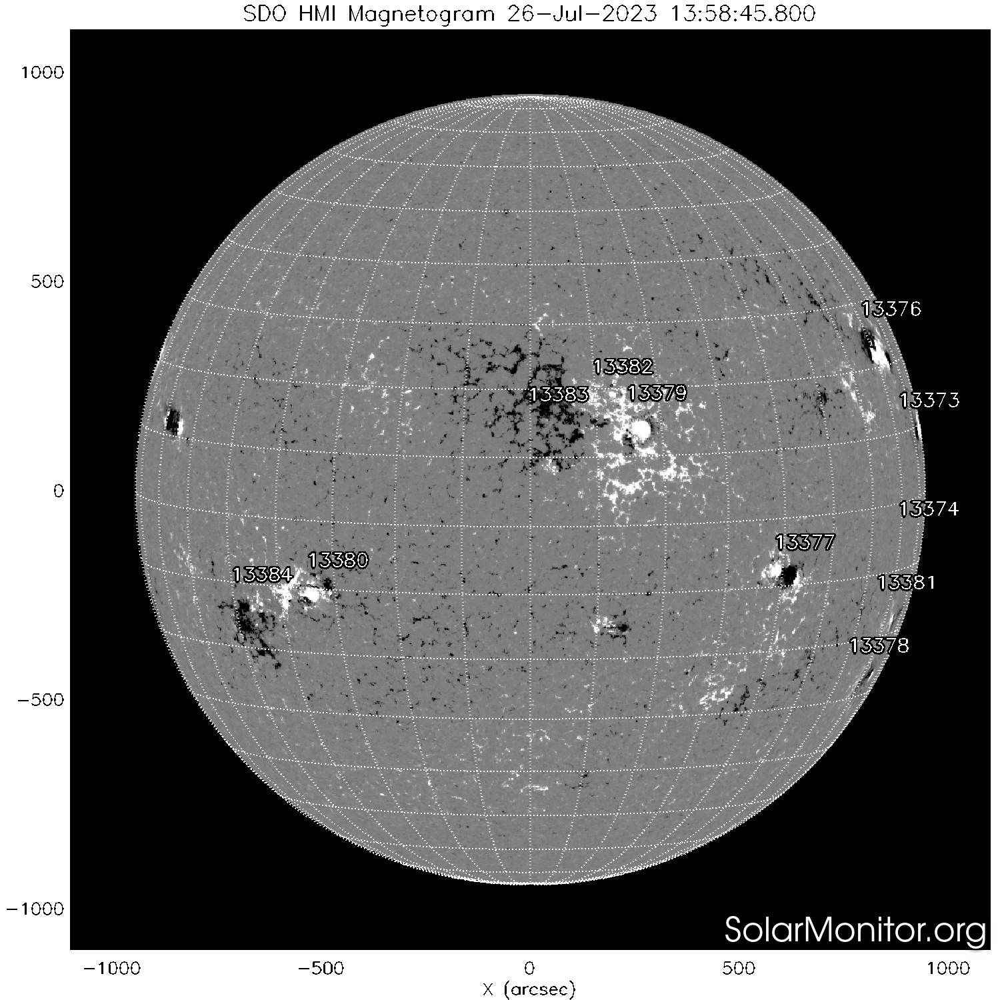

Sunspot group
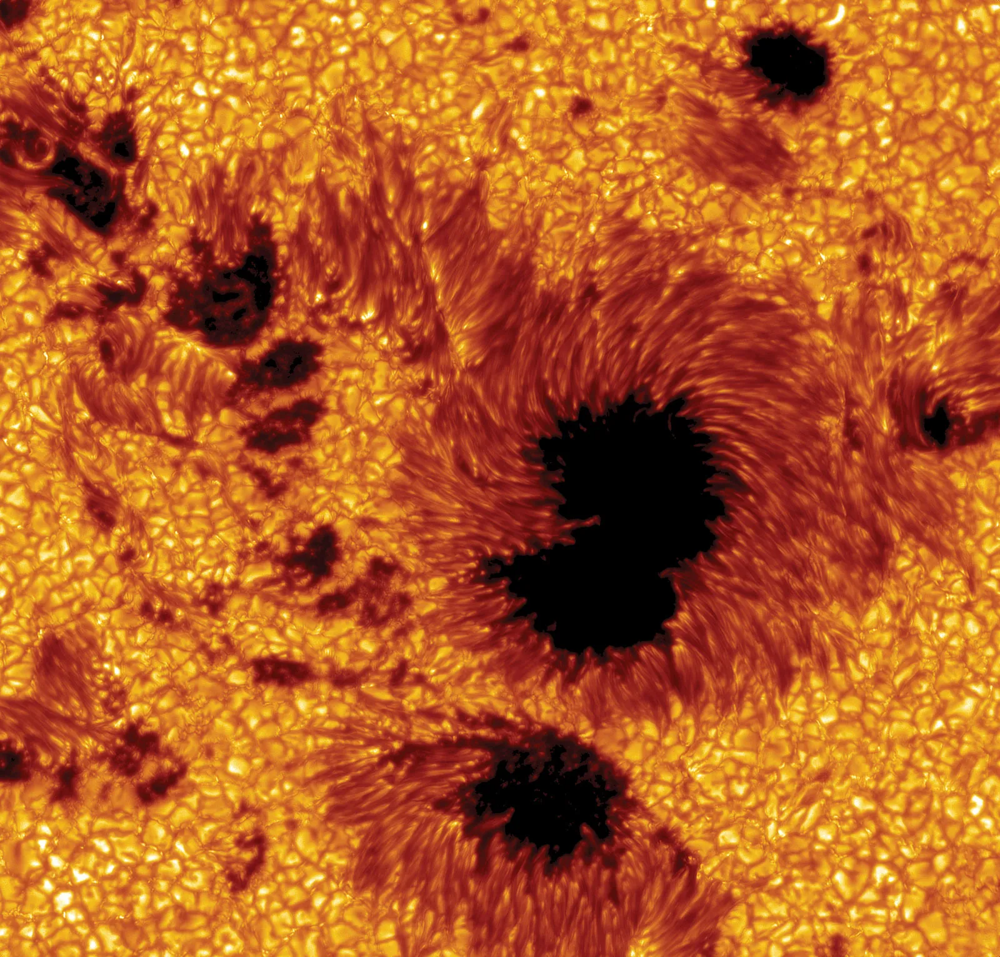
(Credits: Encyclopædia Britannica)



# Why do we have variation in SSN.

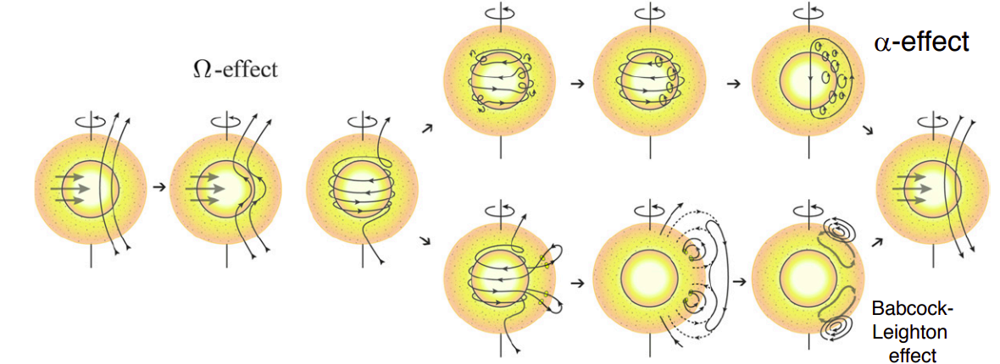

(Credits: [Dr. Allan Sacha Brun](https://www.iiap.res.in/iaus340/sites/default/files/Lecture_StellarDynamoWind.pdf))

In [3]:
import numpy as np
import matplotlib.pyplot as plt

In [4]:
ssn=np.loadtxt("/home/vampy/acads/workshops/Intro_to_Observational_Astronomy_2023/Lecture_2/Data/SSN/SN_d_tot_V2.0.csv",delimiter=';')

In [5]:
type(ssn)

numpy.ndarray

In [6]:
print(ssn)

[[ 1.818e+03  1.000e+00  1.000e+00 ... -1.000e+00  0.000e+00  1.000e+00]
 [ 1.818e+03  1.000e+00  2.000e+00 ... -1.000e+00  0.000e+00  1.000e+00]
 [ 1.818e+03  1.000e+00  3.000e+00 ... -1.000e+00  0.000e+00  1.000e+00]
 ...
 [ 2.023e+03  6.000e+00  2.800e+01 ...  1.920e+01  2.800e+01  0.000e+00]
 [ 2.023e+03  6.000e+00  2.900e+01 ...  1.290e+01  2.900e+01  0.000e+00]
 [ 2.023e+03  6.000e+00  3.000e+01 ...  1.370e+01  2.900e+01  0.000e+00]]


In [7]:
year=[]
number=[]
error=[]

for i in range(len(ssn[::,0])):
    if ssn[i,4]==-1:
        continue
    else:
        year.append(ssn[i,3])
        number.append(ssn[i,4])
        error.append(ssn[i,5])

In [8]:
print(len(year),len(number),len(error))

71809 71809 71809


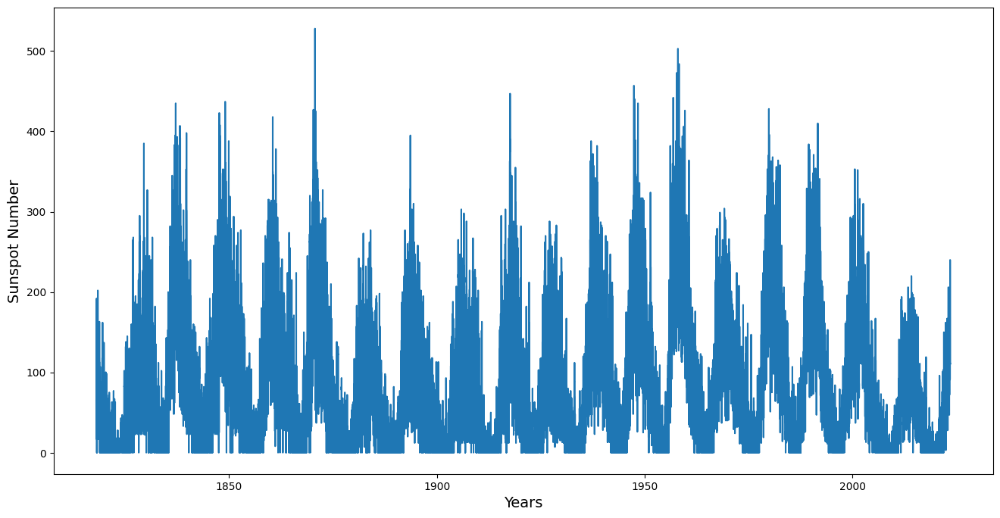

In [9]:
fig=plt.figure(figsize=(16,8))
plt.plot(year,number)
plt.xlabel("Years",fontsize=14)
plt.ylabel("Sunspot Number",fontsize=14)
plt.show()

We can count the number of peaks and divide by the number of the years to get a rough estimate of the period of the sunspot cycle. What is your rough estimate?

Let's look at the first few cycles

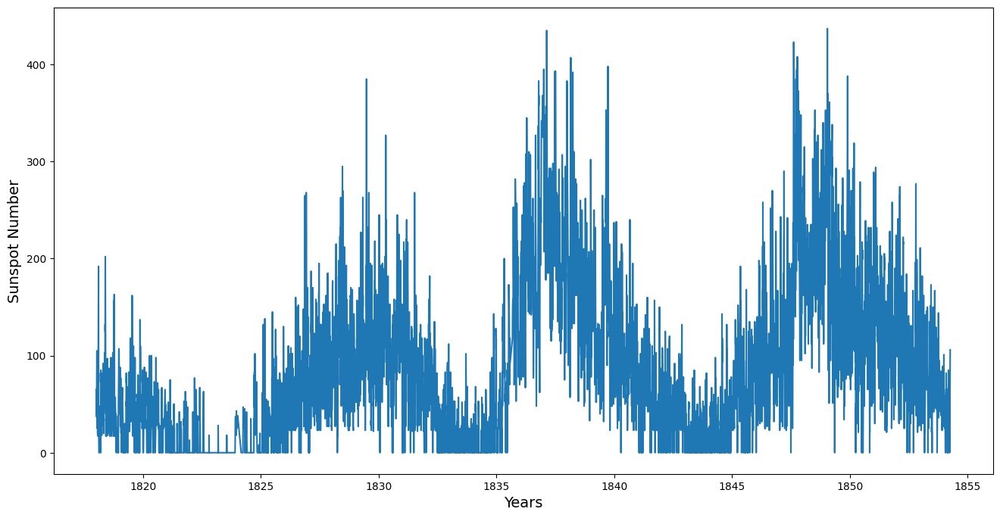

In [10]:
fig=plt.figure(figsize=(16,8))
plt.plot(year[:10000],number[:10000])
plt.xlabel("Years",fontsize=14)
plt.ylabel("Sunspot Number",fontsize=14)
plt.show()

As we are interested in only the yearly sunspot cycle we would like to smooth out the data. For that we will use a `median filter`.

In [11]:
from scipy.signal import medfilt

As we are interested in the yearly variation, for that we will use use the `kernel_size` which is suitable.

In [12]:
k=int(len(year)/(year[-1]-year[0]))

In [13]:
k

349

What should be the value of `year[349]-year[0]`

In [14]:
number_smooth=medfilt(number,kernel_size=k)

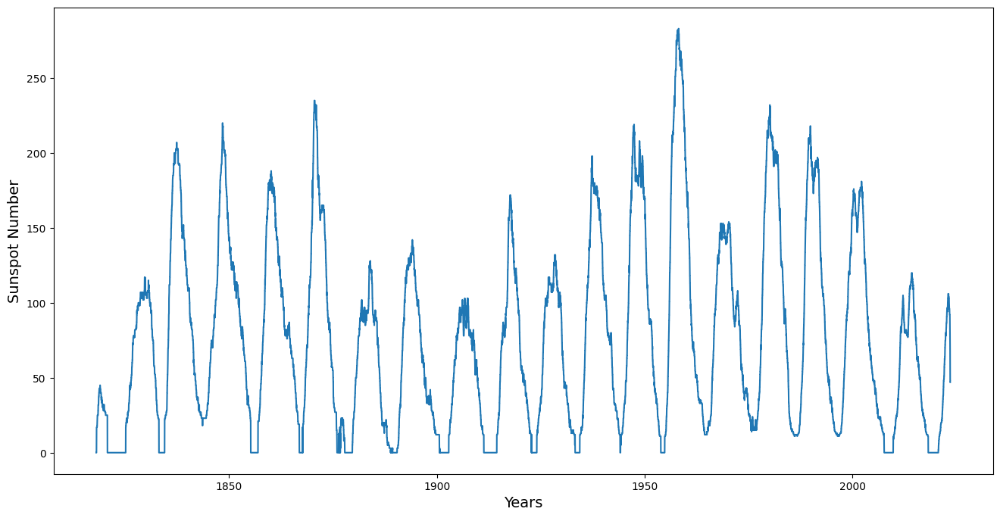

In [15]:
fig=plt.figure(figsize=(16,8))
plt.plot(year,number_smooth)
plt.xlabel("Years",fontsize=14)
plt.ylabel("Sunspot Number",fontsize=14)
plt.show()

In [16]:
ssn_smooth=np.loadtxt("/home/vampy/acads/workshops/Intro_to_Observational_Astronomy_2023/Lecture_2/Data/SSN/SN_ms_tot_V2.0.csv",delimiter=';')

In [17]:
year_sm=[]
number_sm=[]
error_sm=[]

for i in range(len(ssn_smooth[::,0])):
    if ssn_smooth[i,3]==-1:
        continue
    else:
        year_sm.append(ssn_smooth[i,2])
        number_sm.append(ssn_smooth[i,3])
        error_sm.append(ssn_smooth[i,4])

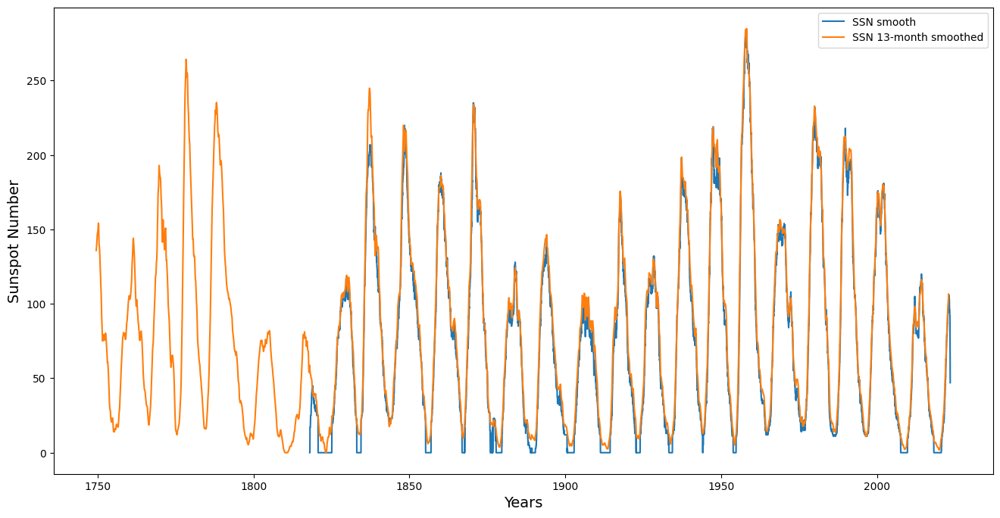

In [18]:
fig=plt.figure(figsize=(16,8))
plt.plot(year,number_smooth)
plt.plot(year_sm,number_sm)
plt.xlabel("Years",fontsize=14)
plt.ylabel("Sunspot Number",fontsize=14)
plt.legend(["SSN smooth","SSN 13-month smoothed"])
plt.show()

We will now use a periodogram to find out the dominant frequencies present in the data.
`LombScargle` is a method to find the periodogram of unevenly spaced data points.

In [19]:
from astropy.timeseries import LombScargle

In [20]:
freq, power=LombScargle(year,number).autopower()

In [21]:
period=1/freq

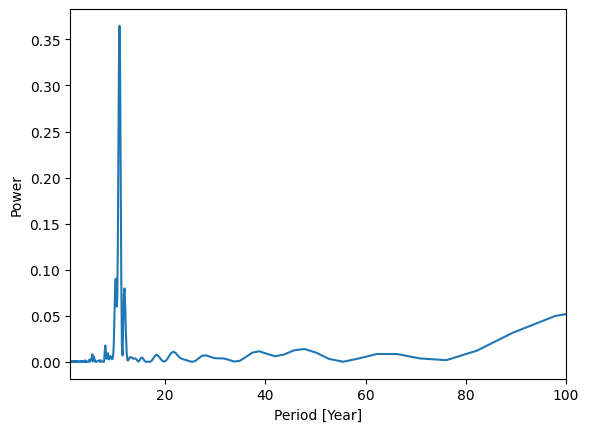

In [22]:
plt.plot(period,power)
plt.xlabel("Period [Year]")
plt.xlim([1,100])
plt.ylabel("Power")
plt.show()

In [23]:
from scipy.signal import find_peaks

In [24]:
peaks,_=find_peaks(power,threshold=0.02)

In [25]:
for i in peaks:
    print(1/freq[i])

10.871640211640209


Which is called the 11 year solar year, sunspot number increase and decrease over this period!!

In [26]:
freq_sm, power_sm=LombScargle(year_sm,number_sm).autopower()

In [27]:
period_sm=1/freq_sm

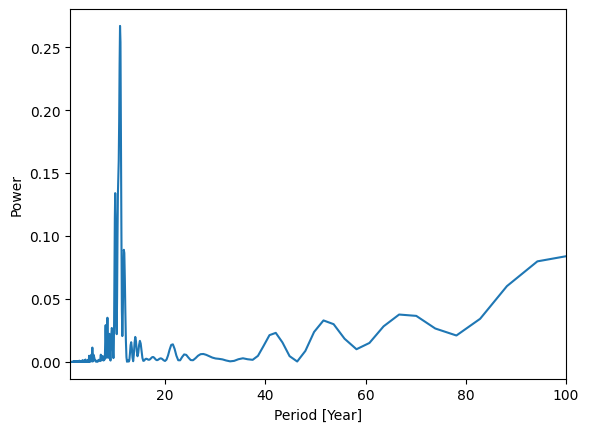

In [28]:
plt.plot(period_sm,power_sm)
plt.xlabel("Period [Year]")
plt.xlim([1,100])
plt.ylabel("Power")
plt.show()

In [29]:
freq_rw, power_rw=LombScargle(year,number).autopower()

In [30]:
period_rw=1/freq_rw

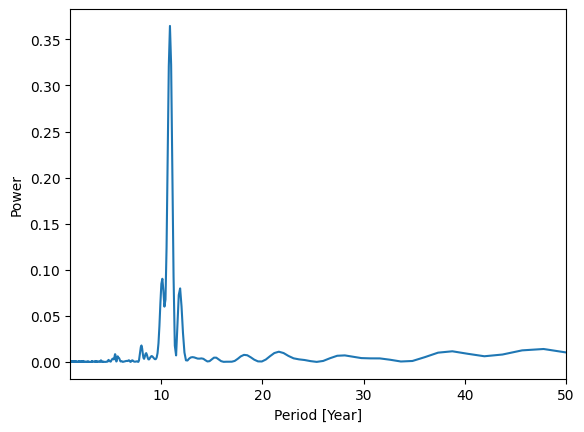

In [36]:
plt.plot(period_rw,power_rw)
plt.xlabel("Period [Year]")
plt.xlim([1,50])
plt.ylabel("Power")
plt.show()